## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

### Exploration
Lets have a look at a sample image, to be used for caliberation. Print out the size of the image

In [1]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import glob

%matplotlib inline

(720, 1280, 3)


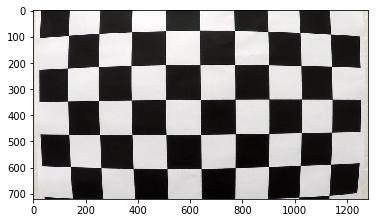

In [2]:
img = mpimg.imread('camera_cal/calibration1.jpg')
image_shape = img.shape
print(image_shape)
plt.imshow(img)

### Caliberation
We can observe that there are 9 corners in a row and 6 corners in a column. I have used glob to iterate over all the camera_cal images to extract the object and image points

In [3]:
def camera_calibration():
    nx = 9
    ny = 6

    objpoints =[]
    imgpoints = []

    objp = np.zeros((nx*ny,3),np.float32)

    objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

    fnames = glob.glob("camera_cal/calibration*.jpg")
    for fname in fnames:
        #img = mpimg.imread('camera_cal/calibration11.jpg')
        img = mpimg.imread(fname)

        gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)

        ret,corners = cv2.findChessboardCorners(gray,(nx,ny),None)

        if ret == True:

            objpoints.append(objp)
            imgpoints.append(corners)

            #cv2.drawChessboardCorners(img, (9,6), corners, ret)
            #plt.imshow(img)
    ret,mtx,dist,rvecs,tvecs = cv2.calibrateCamera(objpoints,imgpoints,gray.shape[::-1],None,None)
    return ret,mtx,dist,rvecs,tvecs

### undistort
Next I will define a function undistort() which uses the calculate camera calibration matrix and distortion coefficients to remove distortion from an image and output the undistorted image.

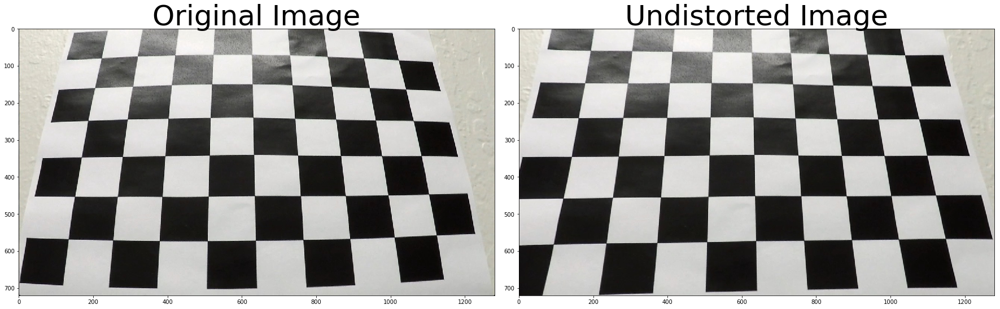

In [4]:
image_test = mpimg.imread('camera_cal/calibration3.jpg')
ret,mtx,dist,rvecs,tvecs=camera_calibration()
dst = cv2.undistort(image_test,mtx,dist,None,mtx)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image_test)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [5]:
def distortion_corrected_image(img,show = False):
    dst = cv2.undistort(img,mtx,dist,None,mtx)
    if show == True:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=50)
        ax2.imshow(dst)
        ax2.set_title('Undistorted Image', fontsize=50)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    return dst

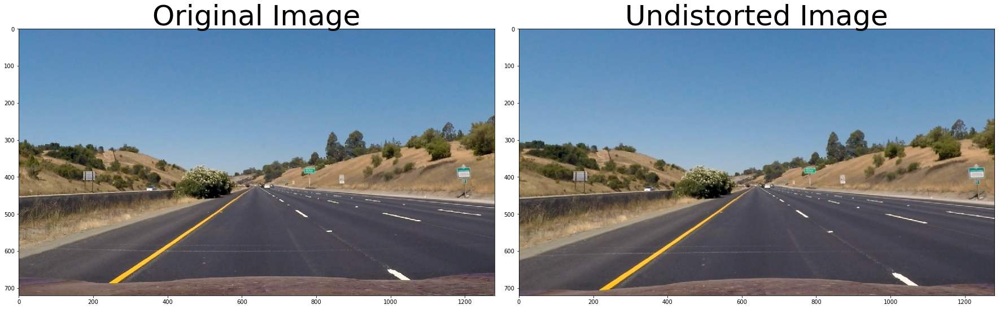

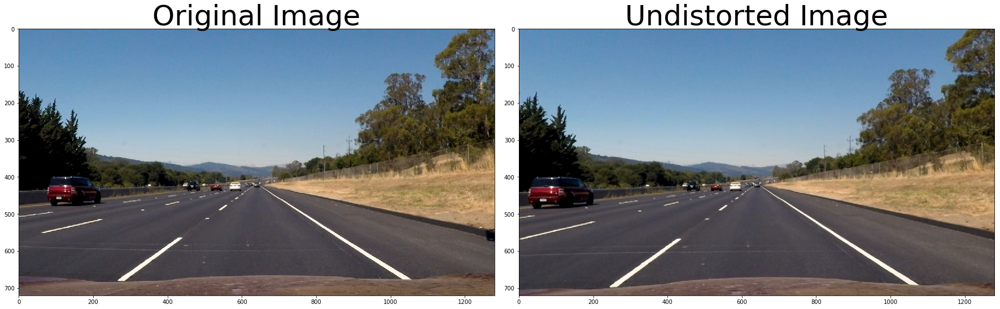

In [6]:
fnames = glob.glob("test_images/straight_lines*.jpg")
for fname in fnames:
    img = mpimg.imread(fname)
    dst=distortion_corrected_image(img,show = True)
    #print(fname)
    #print(fname.split('/')[1])
    str_dir ="output_images/undistorted_ calibration_image/"+fname.split('/')[1]
    cv2.imwrite(str_dir,dst)

## Gradients and color Threshold
We use 2 kinds of gradient thresholds:

1. Along the X axis.
2. Directional gradient with thresholds of 30 and 90 degrees.

This is done since the lane lines are more or less vertical.

We then apply the following color thresholds:

1. R & G channel thresholds so that yellow lanes are detected well.
2. L channel threshold so that we don't take into account edges generated due to shadows.
3. S channel threshold since it does a good job of separating out white & yellow lanes.

In [7]:

def abs_sobel_thresh(img, orient='x', sobel_kernel=3,thresh=(0,255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    # Return the result
    return binary_output

def mag_thresh(img, sobel_kernel=3, thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= thresh[0]) & (gradmag <= thresh[1])] = 1

    # Return the binary image
    return binary_output

# Define a function to threshold an image for a given range and Sobel kernel
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

# Define a function that thresholds the S-channel of HLS
def hls_select_s(img, thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    return binary_output

# Define a function that thresholds the L-channel of HLS
def hls_select_l(img, thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    binary_output = np.zeros_like(l_channel)
    binary_output[(l_channel > thresh[0]) & (l_channel <= thresh[1])] = 1
    return binary_output

In [8]:
def get_thresholded_image(img,show = False):
    
    height, width ,chanel= img.shape 
    
    sx_binary = abs_sobel_thresh(img, orient='x', sobel_kernel=3,thresh=(20, 200))
    dir_binary = dir_threshold(img, sobel_kernel=3, thresh=(np.pi/6, np.pi/2))
    hls_s_binary = hls_select_s(img, thresh=(150, 255))
    hls_l_binary = hls_select_l(img, thresh=(120, 255))
    combined_binary = np.zeros_like(sx_binary)
    combined_binary[((sx_binary==1)&(dir_binary==1))|((hls_s_binary==1)&(hls_l_binary==1))] = 1
    
    # apply the region of interest mask
    mask = np.zeros_like(combined_binary)
    region_of_interest_vertices = np.array([[0,height-1], [width/2, int(0.5*height)], [width-1, height-1]], dtype=np.int32)
    cv2.fillPoly(mask, [region_of_interest_vertices], 1)
    
    thresholded = cv2.bitwise_and(combined_binary, mask)
    
    if show == True:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(img)
        ax1.set_title('Undistorted Image', fontsize=50)
        ax2.imshow(thresholded)
        ax2.set_title('Thresholded Image', fontsize=50)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    return thresholded

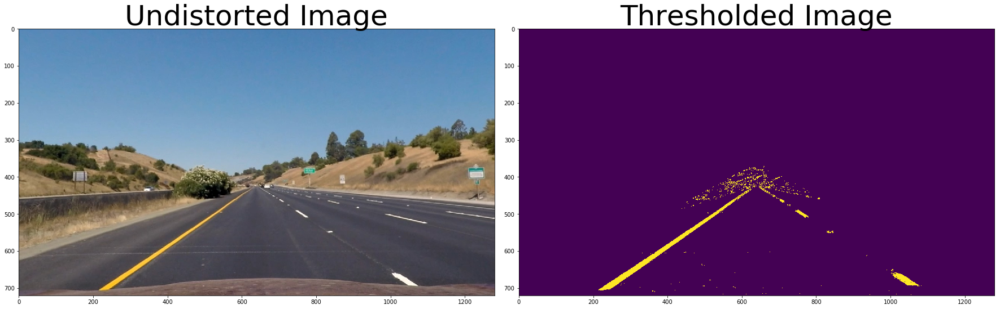

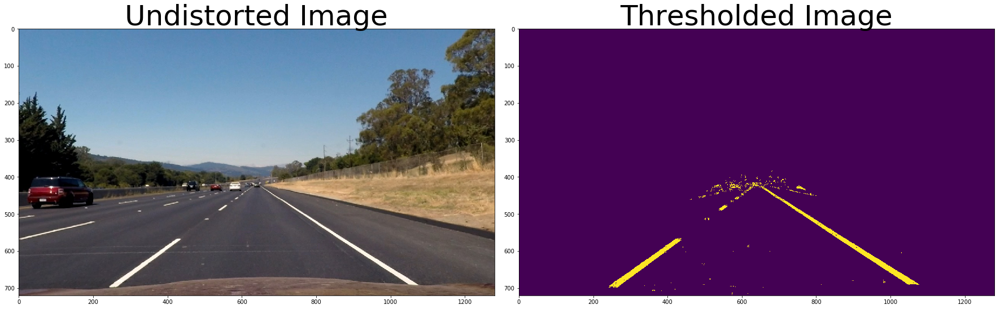

In [9]:
fnames = glob.glob("test_images/straight_lines*.jpg")
for fname in fnames:
    img = mpimg.imread(fname)
    dst = distortion_corrected_image(img)
    thresholded = get_thresholded_image(dst,show = True)
    str_dir ="output_images/thresholded_binary _image/"+fname.split('/')[1]
    cv2.imwrite(str_dir,thresholded)

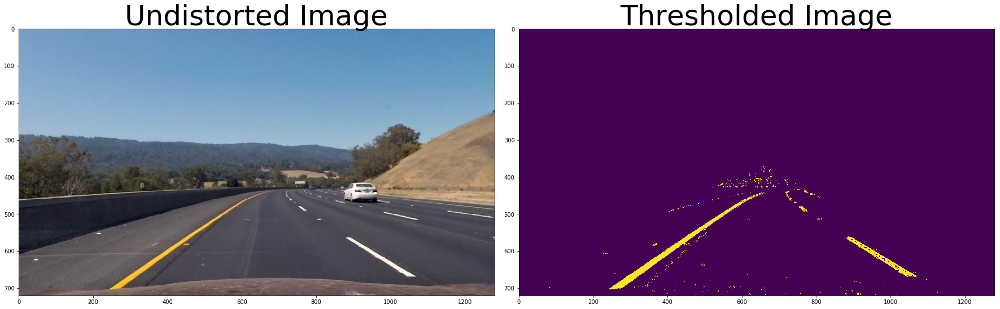

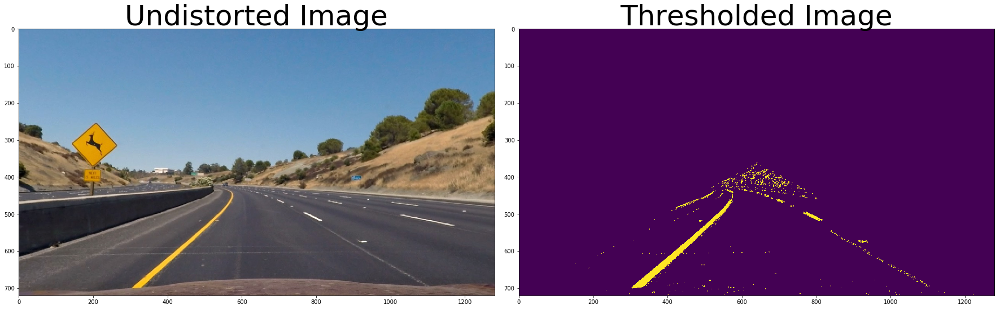

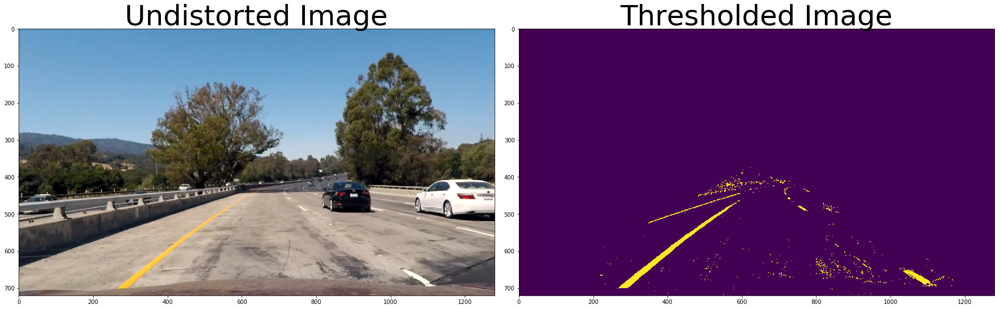

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


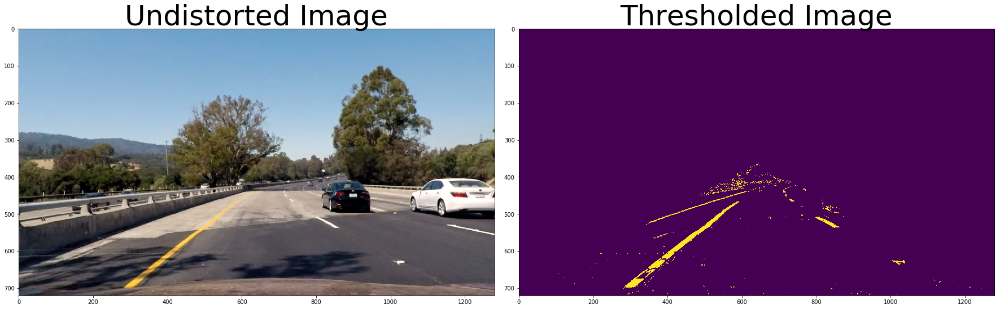

In [10]:
fnames = glob.glob("test_images/test*.jpg")
for fname in fnames:
    img = mpimg.imread(fname)
    dst = distortion_corrected_image(img)
    thresholded = get_thresholded_image(dst,show = True)
    str_dir ="output_images/thresholded_binary _image/"+fname.split('/')[1]
    cv2.imwrite(str_dir,thresholded)

## Perspective Transform
After manually examining a sample image, I extracted the vertices to perform a perspective transform. The polygon with these vertices is drawn on the image for visualization. Destination points are chosen such that straight lanes appear more or less parallel in the transformed image.

The transform and its inverse are computer, for use later. We then transform the binary image to show the birds eye view.

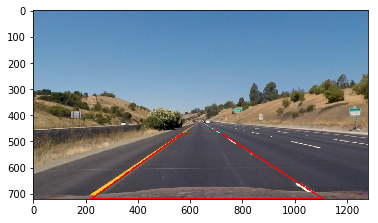

In [11]:
# Vertices extracted manually for performing a perspective transform
bottom_left = [220,720]
bottom_right = [1110, 720]
top_left = [570, 470]
top_right = [722, 470]

source = np.float32([bottom_left,bottom_right,top_right,top_left])

pts = np.array([bottom_left,bottom_right,top_right,top_left], np.int32)
pts = pts.reshape((-1,1,2))

copy =distortion_corrected_image(mpimg.imread("test_images/straight_lines1.jpg")).copy()
cv2.polylines(copy,[pts],True,(255,0,0), thickness=3)
plt.imshow(copy)

In [12]:
def get_perspective_M():
    bottom_left = [220,720]
    bottom_right = [1110, 720]
    top_left = [570, 470]
    top_right = [722, 470]

    source = np.float32([bottom_left,bottom_right,top_right,top_left])

    pts = np.array([bottom_left,bottom_right,top_right,top_left], np.int32)
    pts = pts.reshape((-1,1,2))
    bottom_left = [320,720]
    bottom_right = [920, 720]
    top_left = [320, 1]
    top_right = [920, 1]

    dst = np.float32([bottom_left,bottom_right,top_right,top_left])

    M = cv2.getPerspectiveTransform(source, dst)
    M_inv = cv2.getPerspectiveTransform(dst, source)
    
    return M,M_inv

In [13]:
def perspective_transform(thresholded,M,show=False):
    img_size = (image_shape[1], image_shape[0])
    warped = cv2.warpPerspective(thresholded, M, img_size , flags=cv2.INTER_LINEAR)
    if show == True:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(thresholded)
        ax1.set_title('Thresholded Image', fontsize=50)
        ax2.imshow(warped)
        ax2.set_title('warped Image', fontsize=50)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    return warped

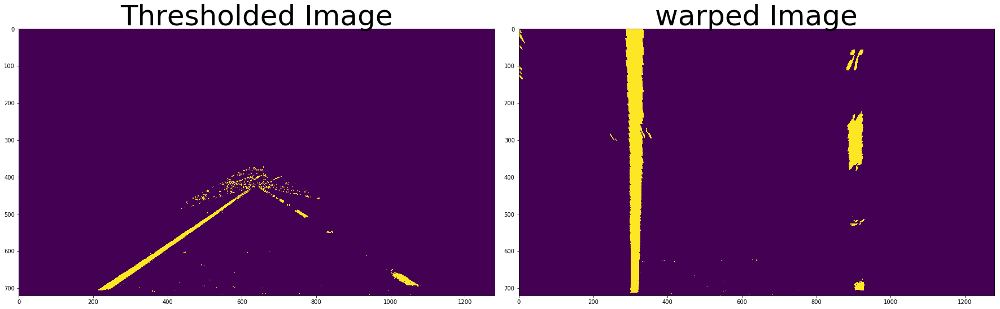

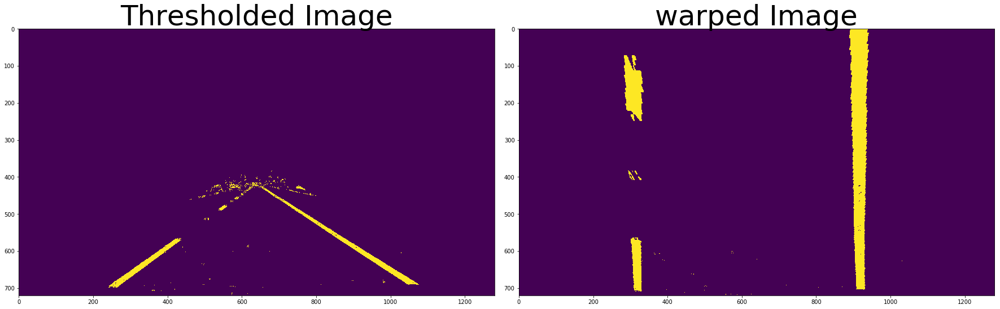

In [14]:
M,M_inv = get_perspective_M()
fnames = glob.glob("test_images/straight_lines*.jpg")
for fname in fnames:
    img = mpimg.imread(fname)
    dst = distortion_corrected_image(img)
    thresholded = get_thresholded_image(dst)
    warped = perspective_transform(thresholded,M,show=True)
    str_dir ="output_images/perspective_transformed_image/"+fname.split('/')[1]
    cv2.imwrite(str_dir,warped)

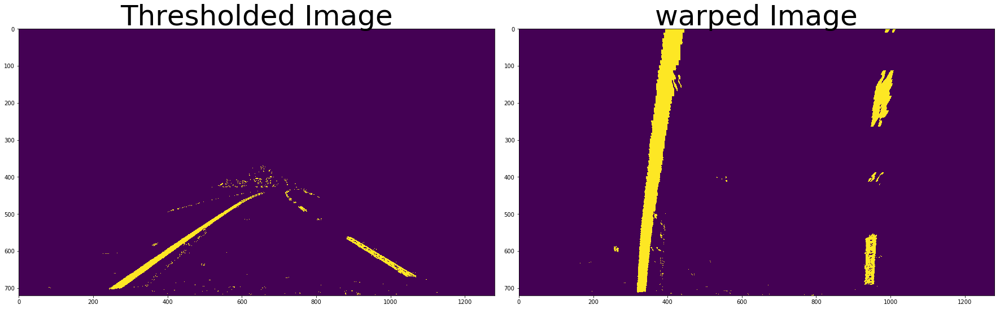

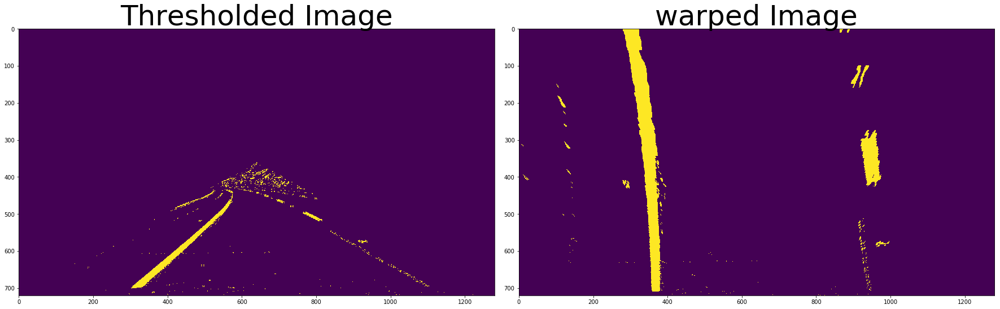

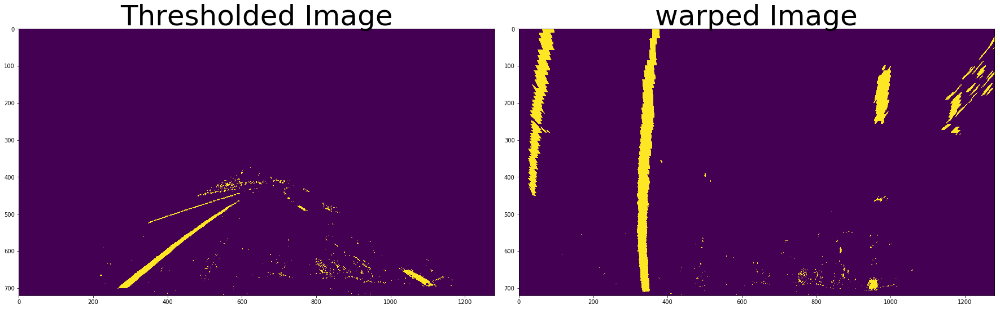

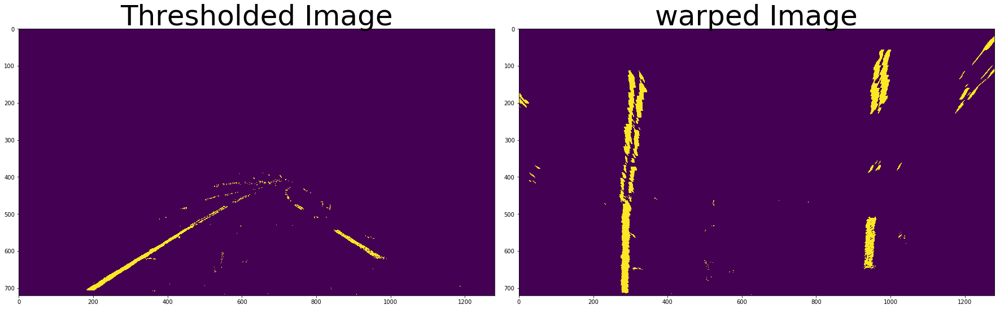

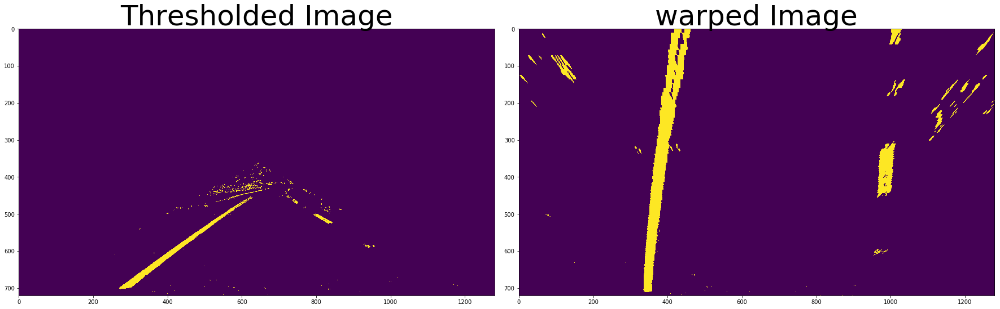

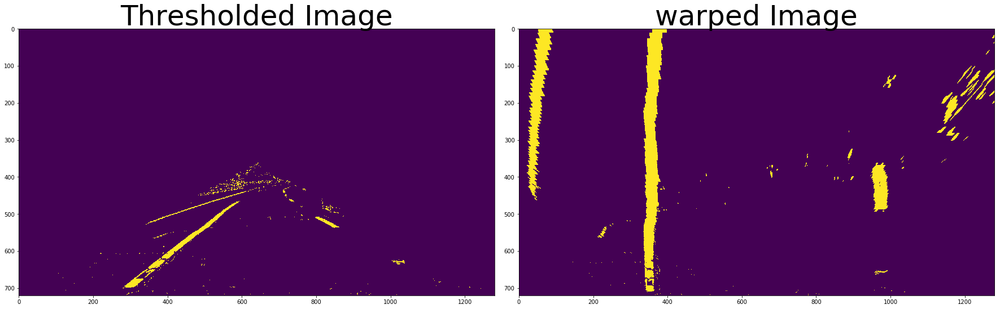

In [15]:
fnames = glob.glob("test_images/test*.jpg")
for fname in fnames:
    img = mpimg.imread(fname)
    dst = distortion_corrected_image(img)
    thresholded = get_thresholded_image(dst)
    warped = perspective_transform(thresholded,M,show=True)
    str_dir ="output_images/perspective_transformed_image/"+fname.split('/')[1]
    cv2.imwrite(str_dir,warped)

## Finding the Lines
## 寻找车道线
The peaks int the histogram tell us about the likely position of the lanes in the image.

### 先测试一下直方图

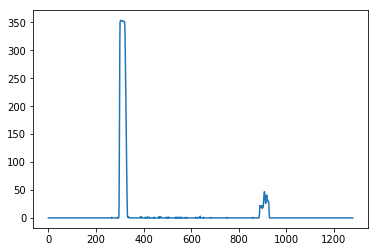

In [16]:
def hist(img):
    # Grab only the bottom half of the image
    # Lane lines are likely to be mostly vertical nearest to the car
    bottom_half = img[img.shape[0]//2:,:]

    # Sum across image pixels vertically - make sure to set an `axis`
    # i.e. the highest areas of vertical lines should be larger values
    histogram = np.sum(bottom_half, axis=0)
    
    return histogram

img = mpimg.imread("test_images/straight_lines1.jpg")
dst = distortion_corrected_image(img)
thresholded = get_thresholded_image(dst)
warped = perspective_transform(thresholded,M)
histogram = hist(warped)

# Visualize the resulting histogram
plt.plot(histogram)

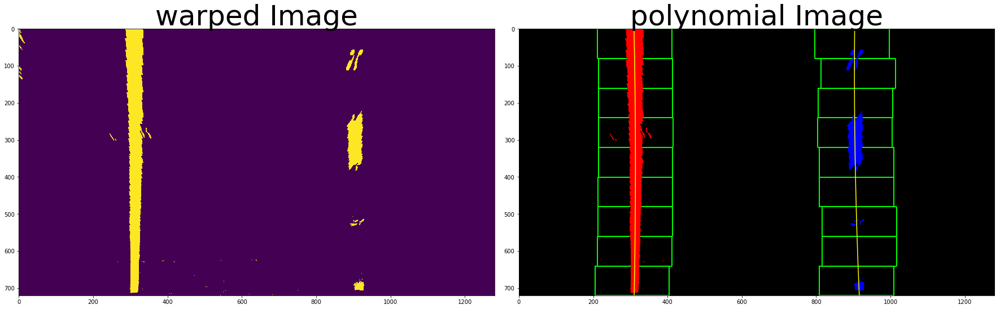

In [17]:
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    # 计算图像高度一半的histogram
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])# 左基准
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint # 右基准

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50 #窗口内最小pixels数目

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero() # 统计像素点数
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    # 用来存储各像素点的index
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        ### TO-DO: Find the four below boundaries of the window ###
        win_xleft_low = leftx_current-margin  
        win_xleft_high = leftx_current+margin  
        win_xright_low = rightx_current-margin  
        win_xright_high = rightx_current+margin 

        # Draw the windows on the visualization image
        # 矩形窗标识
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2)
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2)

        ### 将在窗口内的像素点index存入数组 ###
        # nonzero在这儿来判断是否为true
        # 返回值为nonzeroy，nonzerox数组中index
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]

        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        ### 重新定位基准 ###
        ### nonzerox返回的像素点对应图像中的位置 ###
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    # leftx,lefty...返回lanes的位置数组
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_polynomial(binary_warped,show=False):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    ### 拟合曲线,并返回参数 ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    # 构造等差数组,1px
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]
    if show == True:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(binary_warped)
        ax1.set_title('warped Image', fontsize=50)
        ax2.imshow(out_img)
        # Plots the left and right polynomials on the lane lines
        ax2.plot(left_fitx, ploty, color='yellow')
        ax2.plot(right_fitx, ploty, color='yellow')        
        ax2.set_title('polynomial Image', fontsize=50)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.) 


    return out_img,left_fit,right_fit,ploty


out_img,left_fit,right_fit,ploty= fit_polynomial(warped,show=True)


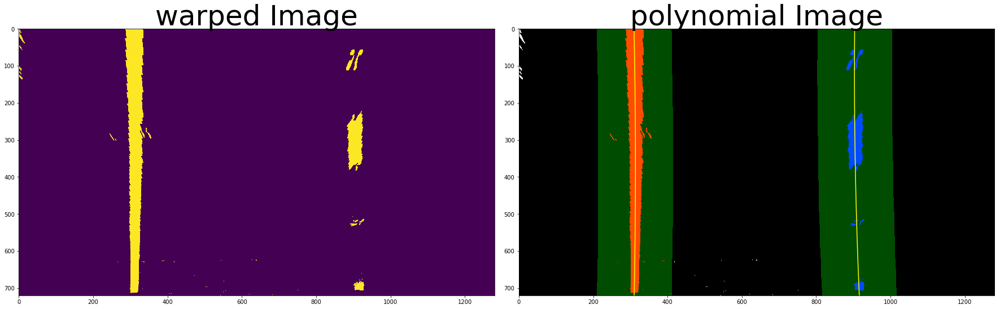

In [18]:
#用曲线预测接下来的点的位置并验证,主要用于视频处理中,增加处理速度

def fit_poly(img_shape, leftx, lefty, rightx, righty):
    ### 拟合曲线 ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fitx, right_fitx, ploty
    # 返回值为左右曲线对应的点

def search_around_poly(binary_warped,show=False):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    # 将曲线左右margin内的index加入数组
    #NOTES:下面的计算是基于数组的,返回值为整个符合条件的数组数据
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    # 用上面的函数返回接下来的预测值
    left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    # 绘制曲线图
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255 #有像素点的为白的基础图
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    # 像素点设置颜色
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    # 以下内容为构造fillpoly的数据格式并绘制图像
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    if show == True:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(binary_warped)
        ax1.set_title('warped Image', fontsize=50)
        ax2.imshow(result)
        # Plots the left and right polynomials on the lane lines
        ax2.plot(left_fitx, ploty, color='yellow')
        ax2.plot(right_fitx, ploty, color='yellow')        
        ax2.set_title('polynomial Image', fontsize=50)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.) 
    ## End visualization steps ##
    
    return result,left_fitx, right_fitx, ploty

# Run image through the pipeline
# Note that in your project, you'll also want to feed in the previous fits
result,left_fitx, right_fitx, ploty = search_around_poly(warped,show=True)


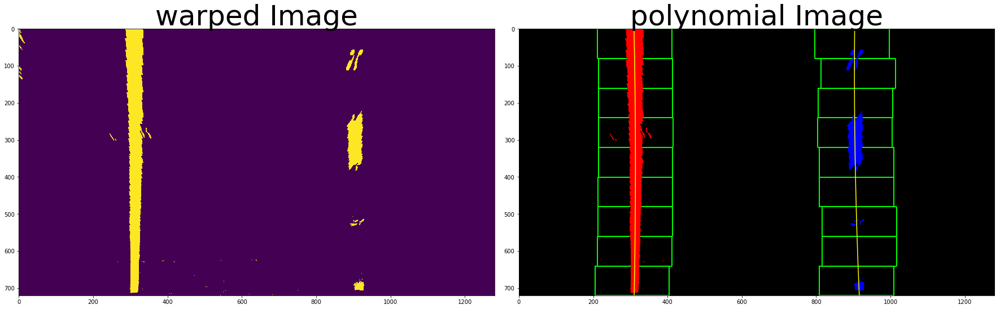

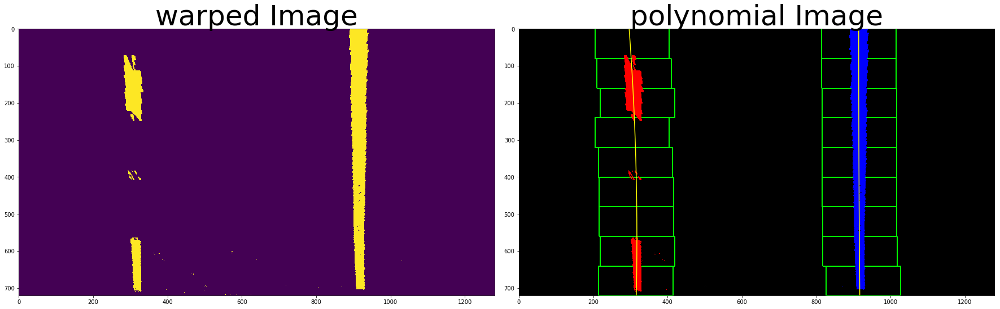

In [19]:
fnames = glob.glob("test_images/straight_lines*.jpg")
for fname in fnames:
    img = mpimg.imread(fname)
    dst = distortion_corrected_image(img)
    thresholded = get_thresholded_image(dst)
    warped = perspective_transform(thresholded,M)
    polynomial_lane,left_fit,right_fit,ploty = fit_polynomial(warped,show=True)
    str_dir ="output_images/lanelines_polynomial/"+fname.split('/')[1]
    cv2.imwrite(str_dir,polynomial_lane)

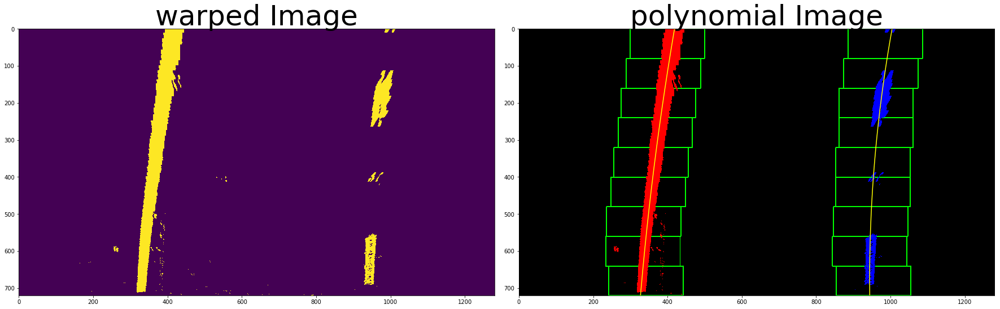

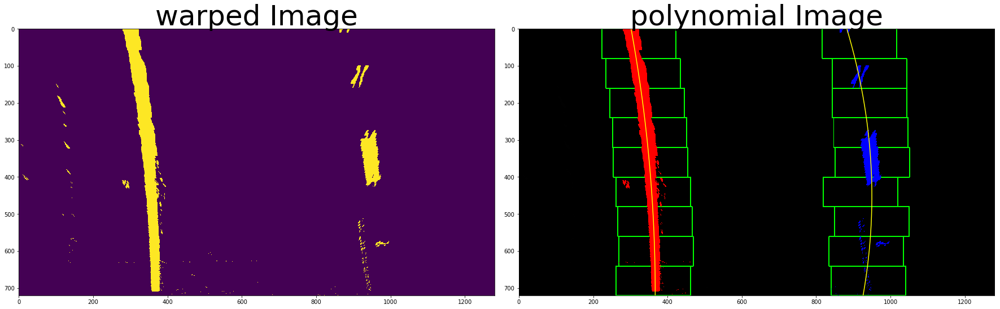

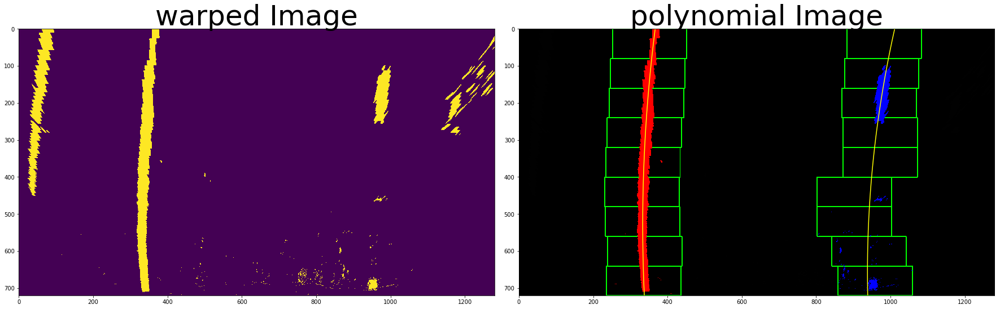

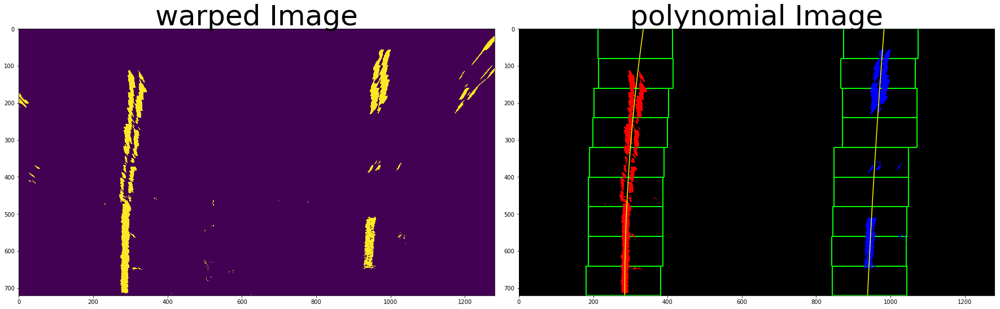

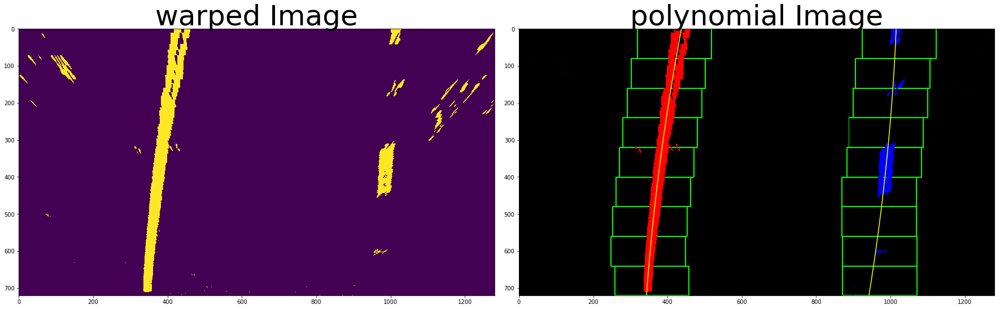

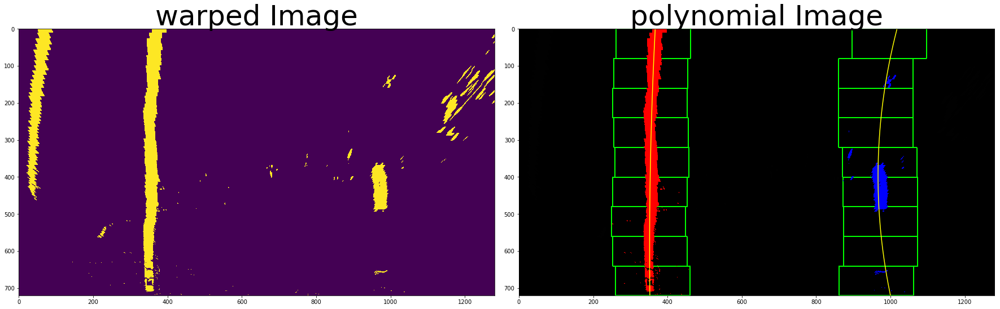

In [20]:
fnames = glob.glob("test_images/test*.jpg")
for fname in fnames:
    img = mpimg.imread(fname)
    dst = distortion_corrected_image(img)
    thresholded = get_thresholded_image(dst)
    warped = perspective_transform(thresholded,M)
    polynomial_lane,left_fit,right_fit,ploty = fit_polynomial(warped,show=True)
    str_dir ="output_images/lanelines_polynomial/"+fname.split('/')[1]
    cv2.imwrite(str_dir,polynomial_lane)

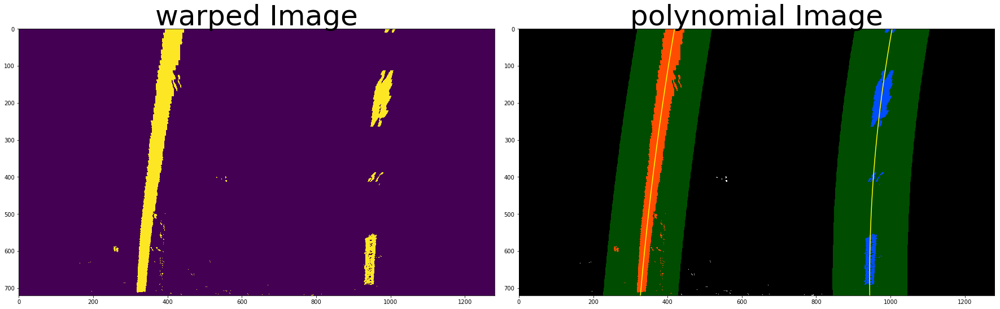

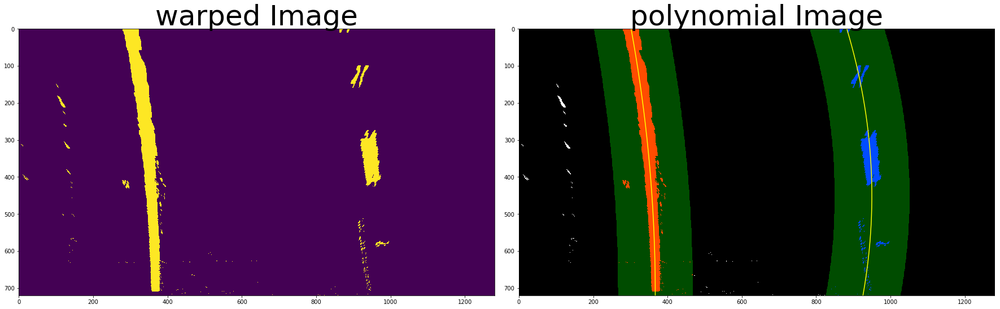

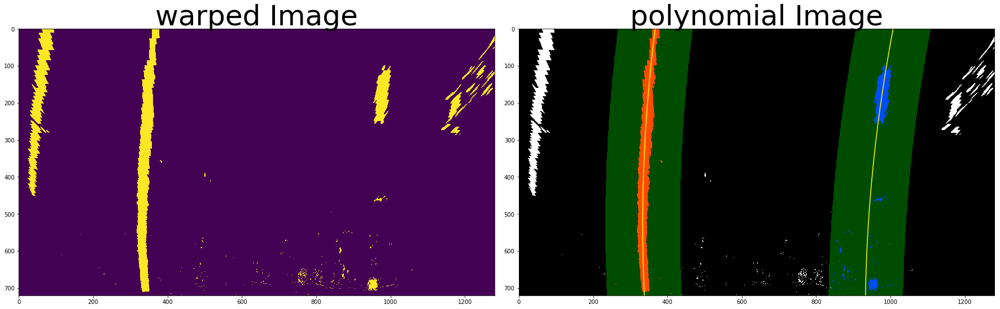

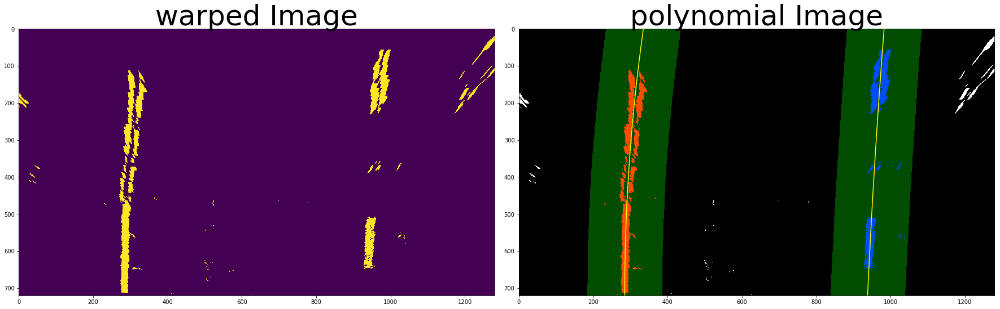

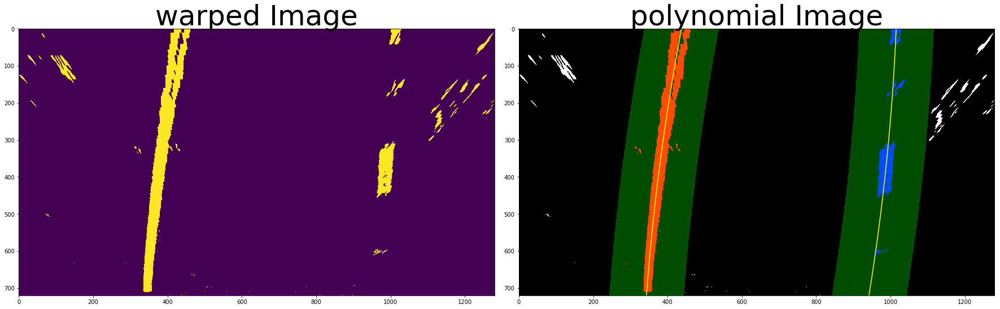

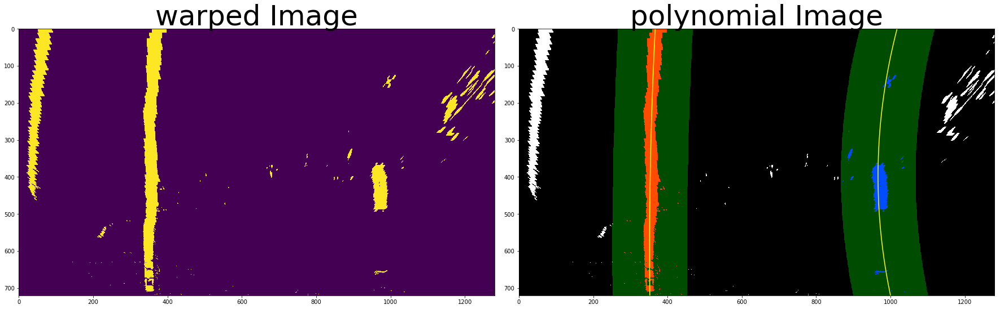

In [21]:
fnames = glob.glob("test_images/test*.jpg")
for fname in fnames:
    img = mpimg.imread(fname)
    dst = distortion_corrected_image(img)
    thresholded = get_thresholded_image(dst)
    warped = perspective_transform(thresholded,M)
    polynomial_lane,left_fit,right_fit,ploty = fit_polynomial(warped)
    result,left_fitx, right_fitx, ploty = search_around_poly(warped,show=True)
    str_dir ="output_images/lanelines_polynomial/"+fname.split('/')[1]
    cv2.imwrite(str_dir,result)

## Computing the radius of curvature and center offset.

## 计算转弯半径和中心偏离位置

The radius of curvature is computed according to the formula and method described in the classroom material. Since we perform the polynomial fit in pixels and whereas the curvature has to be calculated in real world meters, we have to use a pixel to meter transformation and recompute the fit again.

The mean of the lane pixels closest to the car gives us the center of the lane. The center of the image gives us the position of the car. The difference between the 2 is the offset from the center.

In [22]:
def measure_curvature_real(ploty,left_fitx,right_fitx):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Start by generating our fake example data
    # Make sure to feed in your real data instead in your project!
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    ##### TO-DO: Implement the calculation of R_curve (radius of curvature) #####
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    return left_curverad, right_curverad-1

In [23]:
left_curve_rad,right_curve_rad = measure_curvature_real(ploty,left_fitx,right_fitx)
def get_rad_offset_str(left_curve_rad,right_curve_rad):
    average_curve_rad = (left_curve_rad + right_curve_rad)/2
    curvature_string = "Radius of curvature: %.2f m" % average_curve_rad
    #print(curvature_string)
    img_size = (image_shape[1], image_shape[0])
    # compute the offset from the center
    lane_center = (right_fitx[-1] + left_fitx[-1])/2
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    center_offset_pixels = abs(img_size[0]/2 - lane_center)
    center_offset_mtrs = xm_per_pix*center_offset_pixels
    offset_string = "Center offset: %.2f m" % center_offset_mtrs
    #print(offset_string)
    return curvature_string,offset_string

curvature_string,offset_string=get_rad_offset_str(left_curve_rad,right_curve_rad)

## Inverse Transform

In this block of code we:
1. Paint the lane area
2. Perform an inverse perspective transform
3. Combine the precessed image with the original image.

In [25]:
# Create an image to draw the lines on
def inverse_transform(undistort_img,warped,M_inv,curvature_string,offset_string,ploty,left_fitx,right_fitx,show=False):
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, M_inv, (image_shape[1], image_shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undistort_img, 1, newwarp, 0.3, 0)
    cv2.putText(result,curvature_string,(120,90),cv2.FONT_HERSHEY_SIMPLEX, 1.5,(255,255,255), thickness=3)
    cv2.putText(result,offset_string,(120,150),cv2.FONT_HERSHEY_SIMPLEX, 1.5,(255,255,255), thickness=3)
    if show == True:
        f, ax1 = plt.subplots(1, 1, figsize=(9, 6))
        f.tight_layout()
        ax1.imshow(result)
        ax1.set_title('Final Image', fontsize=20)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    return result

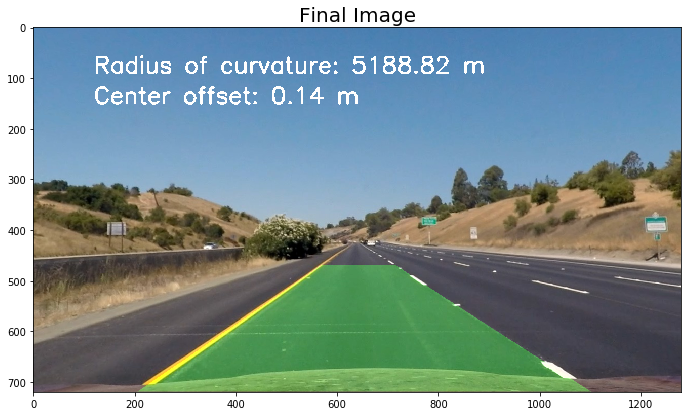

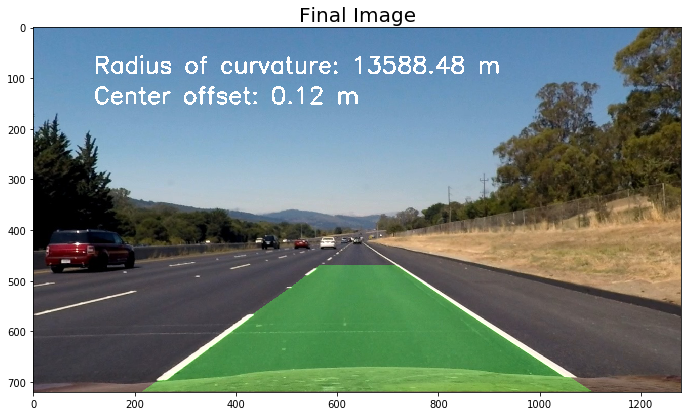

In [26]:
fnames = glob.glob("test_images/straight_lines*.jpg")
M,M_inv = get_perspective_M()
for fname in fnames:
    img = mpimg.imread(fname)
    dst = distortion_corrected_image(img)
    thresholded = get_thresholded_image(dst)
    warped = perspective_transform(thresholded,M)
    polynomial_lane,left_fit,right_fit,ploty = fit_polynomial(warped)
    
    result,left_fitx, right_fitx, ploty = search_around_poly(warped)
    left_curve_rad,right_curve_rad = measure_curvature_real(ploty,left_fitx,right_fitx)
    
    curvature_string,offset_string=get_rad_offset_str(left_curve_rad,right_curve_rad)
    final_imgage=inverse_transform(dst,warped,M_inv,curvature_string,offset_string,ploty,left_fitx,right_fitx,show=True)
    
    str_dir ="output_images/final_image/"+fname.split('/')[1]
    cv2.imwrite(str_dir,final_imgage)

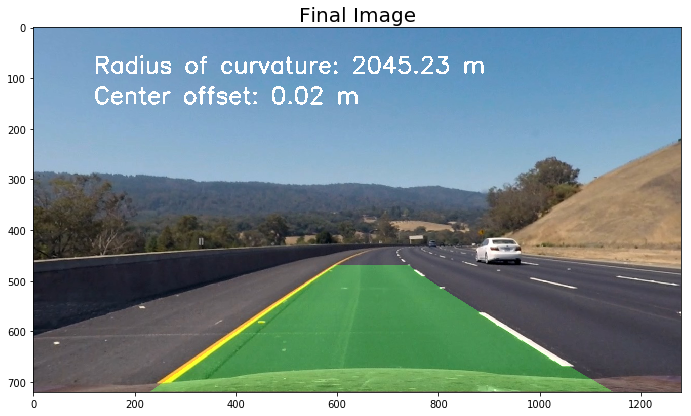

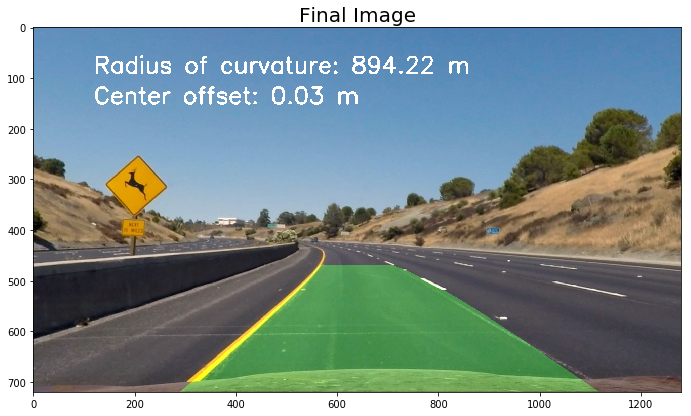

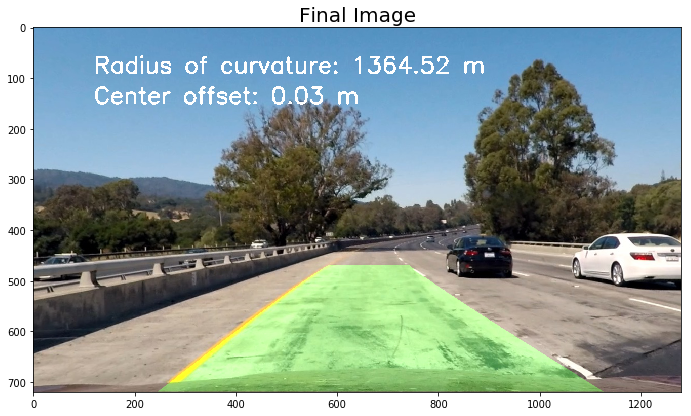

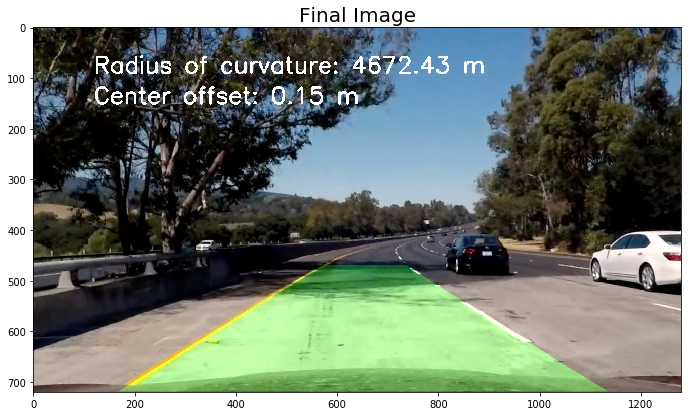

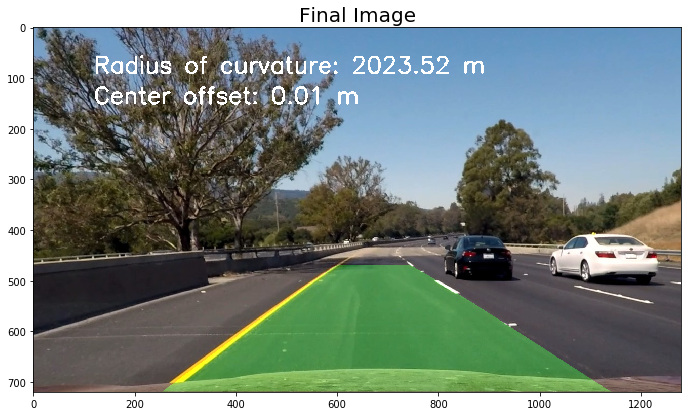

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [27]:
fnames = glob.glob("test_images/test*.jpg")
M,M_inv = get_perspective_M()
for fname in fnames:
    img = mpimg.imread(fname)
    dst = distortion_corrected_image(img)
    thresholded = get_thresholded_image(dst)
    warped = perspective_transform(thresholded,M)
    polynomial_lane,left_fit,right_fit,ploty = fit_polynomial(warped)
    
    result,left_fitx, right_fitx, ploty = search_around_poly(warped)
    left_curve_rad,right_curve_rad = measure_curvature_real(ploty,left_fitx,right_fitx)
    
    curvature_string,offset_string=get_rad_offset_str(left_curve_rad,right_curve_rad)
    final_imgage=inverse_transform(dst,warped,M_inv,curvature_string,offset_string,ploty,left_fitx,right_fitx,show=True)
    
    str_dir ="output_images/final_image/"+fname.split('/')[1]
    cv2.imwrite(str_dir,final_imgage)

## Video Processing Pipeline:

First I am going to establish a class Line() for the lines to store attributes about the lane lines from one frame to the next. Inside the class I will define several functions which will be used to detect the pixels belonging to each lane line.

In [28]:
from moviepy.editor import VideoFileClip

In [29]:
from IPython.display import HTML
HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format('project_video.mp4'))

In [30]:
def pipeline_precess(img):
    image_shape = img.shape
    img_size = (image_shape[1], image_shape[0])
    dst = distortion_corrected_image(img)
    thresholded = get_thresholded_image(dst)
    warped = perspective_transform(thresholded,M)
    polynomial_lane,left_fit,right_fit,ploty = fit_polynomial(warped)
    
    result,left_fitx, right_fitx, ploty = search_around_poly(warped)
    left_curve_rad,right_curve_rad = measure_curvature_real(ploty,left_fitx,right_fitx)
    
    curvature_string,offset_string=get_rad_offset_str(left_curve_rad,right_curve_rad)
    final_imgage=inverse_transform(dst,warped,M_inv,curvature_string,offset_string,ploty,left_fitx,right_fitx)
    
    return final_imgage

In [31]:
video_output = 'result.mp4'
clip1 = VideoFileClip("project_video.mp4").subclip(0,50)
white_clip = clip1.fl_image(pipeline_precess) 
white_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video result.mp4
[MoviePy] Writing video result.mp4


100%|█████████▉| 1250/1251 [03:33<00:00,  5.87it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: result.mp4 



In [32]:
HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format('result.mp4'))


### Improve piping and speed up processing

### 改进一下管道,加快处理速度


In [33]:
# Some global variables
polyfit_left=None
polyfit_right=None

past_good_left_lines = []
past_good_right_lines = []

running_mean_difference_between_lines = 0

def get_line_predictions(non_zeros_x, non_zeros_y, left_coordinates, right_coordinates, num_rows):
    """
        Given ncoordinates of non-zeros pixels and coordinates of non-zeros pixels within the sliding windows,
        this function generates a prediction for the lane line.
    """
    left_x = non_zeros_x[left_coordinates]
    left_y = non_zeros_y[left_coordinates]
    
    # If no pixels were found return None
    if(left_y.size == 0 or left_x.size == 0):
        return None, None

    # Fit the polynomial
    polyfit_left = np.polyfit(left_y, left_x, 2)

    right_x = non_zeros_x[right_coordinates]
    right_y = non_zeros_y[right_coordinates]
    
    # If no pixels were found return None
    if(right_y.size == 0 or right_x.size == 0):
        return None, None

    # Fit the polynomial
    polyfit_right = np.polyfit(right_y, right_x, 2)

    # If no pixels were found return None
    y_points = np.linspace(0, num_rows-1, num_rows)
    
    # Generate the lane lines from the polynomial fit
    left_x_predictions = polyfit_left[0]*y_points**2 + polyfit_left[1]*y_points + polyfit_left[2]
    right_x_predictions = polyfit_right[0]*y_points**2 + polyfit_right[1]*y_points + polyfit_right[2]
    
    return left_x_predictions, right_x_predictions

def brute_search(warped):
    
    """
        This function searches for lane lines from scratch.
        Thresholding & performing a sliding window search.
        用枚举法寻找车道线
        返回值为:车道线坐标
    """
    non_zeros = warped.nonzero()
    non_zeros_y = non_zeros[0]
    non_zeros_x = non_zeros[1]
    
    num_rows = warped.shape[0]
    
    histogram = np.sum(warped[warped.shape[0]//2:,:], axis=0)

    half_width = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:half_width])
    rightx_base = np.argmax(histogram[half_width:]) + half_width

    num_windows = 10
    window_height = np.int(num_rows/num_windows)
    window_half_width = 50

    min_pixels = 100

    left_coordinates = []
    right_coordinates = []

    for window in range(num_windows):
        y_max = num_rows - window*window_height
        y_min = num_rows - (window+1)* window_height

        left_x_min = leftx_base - window_half_width
        left_x_max = leftx_base + window_half_width

        good_left_window_coordinates = ((non_zeros_x >= left_x_min) & (non_zeros_x <= left_x_max) & (non_zeros_y >= y_min) & (non_zeros_y <= y_max)).nonzero()[0]
        left_coordinates.append(good_left_window_coordinates)

        if len(good_left_window_coordinates) > min_pixels:
            leftx_base = np.int(np.mean(non_zeros_x[good_left_window_coordinates]))

        right_x_min = rightx_base - window_half_width
        right_x_max = rightx_base + window_half_width

        good_right_window_coordinates = ((non_zeros_x >= right_x_min) & (non_zeros_x <= right_x_max) & (non_zeros_y >= y_min) & (non_zeros_y <= y_max)).nonzero()[0]
        right_coordinates.append(good_right_window_coordinates)

        if len(good_right_window_coordinates) > min_pixels:
            rightx_base = np.int(np.mean(non_zeros_x[good_right_window_coordinates]))

    left_coordinates = np.concatenate(left_coordinates)
    right_coordinates = np.concatenate(right_coordinates)
    
    left_x_predictions, right_x_predictions = get_line_predictions(non_zeros_x, non_zeros_y, left_coordinates, right_coordinates, num_rows)
    return left_x_predictions, right_x_predictions

def get_averaged_line(previous_lines, new_line):
    """
        This function computes an averaged lane line by averaging over previous good frames.
    """
    
    # Number of frames to average over
    num_frames = 12
    
    if new_line is None:
        # No line was detected
        
        if len(previous_lines) == 0:
            # If there are no previous lines, return None
            return previous_lines, None
        else:
            # Else return the last line
            return previous_lines, previous_lines[-1]
    else:
        if len(previous_lines) < num_frames:
            # we need at least num_frames frames to average over
            previous_lines.append(new_line)
            return previous_lines, new_line
        else:
            # average over the last num_frames frames
            previous_lines[0:num_frames-1] = previous_lines[1:]
            previous_lines[num_frames-1] = new_line
            new_line = np.zeros_like(new_line)
            for i in range(num_frames):
                new_line += previous_lines[i]
            new_line /= num_frames
            return previous_lines, new_line
        
        
def get_mean_distance_between_lines(left_line, right_line, running_average):
    """
        Returns running weighted average of simple difference between left and right lines
    """
    mean_distance = np.mean(right_line - left_line)
    if running_average == 0:
        running_average = mean_distance
    else:
        running_average = 0.9*running_average + 0.1*mean_distance
    return running_average
    

def pipeline_final(img):
    # global variables to store the polynomial coefficients of the line detected in the last frame
    global polyfit_right
    global polyfit_left
    
    # global variables to store the line coordinates in previous n (=4) frames
    global past_good_right_lines
    global past_good_left_lines
    
    # global variable which contains running average of the mean difference between left and right lanes
    global running_mean_difference_between_lines
    
    img_shape = img.shape
    img_size = (image_shape[1], image_shape[0])
    
    # get thresholded image
    thresholded = get_thresholded_image(img)
    
    # perform a perspective transform
    warped = cv2.warpPerspective(thresholded, M, img_size , flags=cv2.INTER_LINEAR)
    
    out_img = np.dstack((warped, warped, warped))*255
    
    non_zeros = warped.nonzero()
    non_zeros_y = non_zeros[0]
    non_zeros_x = non_zeros[1]
    
    num_rows = warped.shape[0]
    y_points = np.linspace(0, num_rows-1, num_rows)
    
    # 此处为判断什么时候采用曲线预测和枚举法
    
    if (polyfit_left is None) or (polyfit_right is None):
        # If the polynomial coefficients of the previous frames are None then perform a brute force search
        brute = True
        left_x_predictions, right_x_predictions = brute_search(warped)
    else:
        # Else search in a margin of 100 pixels on each side of the pervious polynomial fit
        brute = False
        margin = 100
        left_x_predictions = polyfit_left[0]*non_zeros_y**2 + polyfit_left[1]*non_zeros_y + polyfit_left[2]
        left_coordinates = ((non_zeros_x >= left_x_predictions - margin) & (non_zeros_x <= left_x_predictions + margin)).nonzero()[0]

        right_x_predictions = polyfit_right[0]*non_zeros_y**2 + polyfit_right[1]*non_zeros_y + polyfit_right[2]
        right_coordinates = ((non_zeros_x >= right_x_predictions - margin) & (non_zeros_x <= right_x_predictions + margin)).nonzero()[0]
        
        left_x_predictions, right_x_predictions = get_line_predictions(non_zeros_x, non_zeros_y, left_coordinates, right_coordinates, num_rows)
    
    if (left_x_predictions is None or right_x_predictions is None):
        if not brute:
            left_x_predictions, right_x_predictions = brute_search(warped)
            
    bad_lines = False
            
    if (left_x_predictions is None or right_x_predictions is None):
        bad_lines = True
    else:
        mean_difference = np.mean(right_x_predictions - left_x_predictions)
        
        if running_mean_difference_between_lines == 0:
            running_mean_difference_between_lines = mean_difference
        
        if (mean_difference < 0.7*running_mean_difference_between_lines or mean_difference > 1.3*running_mean_difference_between_lines):
            bad_lines = True
            if not brute:
                left_x_predictions, right_x_predictions = brute_search(warped)
                if (left_x_predictions is None or right_x_predictions is None):
                    bad_lines = True
                else:
                    mean_difference = np.mean(right_x_predictions - left_x_predictions)
                    if (mean_difference < 0.7*running_mean_difference_between_lines or mean_difference > 1.3*running_mean_difference_between_lines):
                        bad_lines = True
                    else:
                        bad_lines = False
        else:
            bad_lines = False
            
    if bad_lines:
        polyfit_left = None
        polyfit_right = None
        if len(past_good_left_lines) == 0 and len(past_good_right_lines) == 0:
            return img
        else:
            left_x_predictions = past_good_left_lines[-1]
            right_x_predictions = past_good_right_lines[-1]
    else:
        past_good_left_lines, left_x_predictions = get_averaged_line(past_good_left_lines, left_x_predictions)
        past_good_right_lines, right_x_predictions = get_averaged_line(past_good_right_lines, right_x_predictions)
        mean_difference = np.mean(right_x_predictions - left_x_predictions)
        running_mean_difference_between_lines = 0.9*running_mean_difference_between_lines + 0.1*mean_difference
    
    left_line_window = np.array(np.transpose(np.vstack([left_x_predictions, y_points])))
    right_line_window = np.array(np.flipud(np.transpose(np.vstack([right_x_predictions, y_points]))))
    
    # compute the radius of curvature
    
    left_curve_rad,right_curve_rad =measure_curvature_real(y_points,left_x_predictions,right_x_predictions)
    average_curve_rad = (left_curve_rad + right_curve_rad)/2
    curvature_string = "Radius of curvature: %.2f m" % average_curve_rad
    
    # compute the offset from the center
    lane_center = (right_x_predictions[num_rows-1] + left_x_predictions[num_rows-1])/2
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    center_offset_pixels = abs(img_size[0]/2 - lane_center)
    center_offset_mtrs = xm_per_pix*center_offset_pixels
    offset_string = "Center offset: %.2f m" % center_offset_mtrs
    
    poly_points = np.vstack([left_line_window, right_line_window])
    
    cv2.fillPoly(out_img, np.int_([poly_points]), [0,255, 0])
    
    unwarped = cv2.warpPerspective(out_img, M_inv, img_size , flags=cv2.INTER_LINEAR)

    result = cv2.addWeighted(img, 1, unwarped, 0.3, 0)
    
    cv2.putText(result,curvature_string , (100, 90), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), thickness=2)
    cv2.putText(result, offset_string, (100, 150), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), thickness=2)
    
    return result

In [34]:
polyfit_left = None
polyfit_right = None
past_good_right_lines = []
past_good_left_lines = []
running_mean_difference_between_lines = 0

output = 'project_video_output.mp4'
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(pipeline_final) #NOTE: this function expects color images!!
%time white_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [02:55<00:00,  7.19it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 26min 16s, sys: 50 s, total: 27min 6s
Wall time: 2min 56s


In [35]:
HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format('result.mp4'))

# Discussion

## Issues and Challenges

### Gradient & Color Thresholding
1. I had to experiment a lot with gradient and color channnel thresholding.
2. The lanes lines in the challenge and harder challenge videos were extremely difficult to detect. They were either too bright or too dull. This prompted me to have R & G channel thresholding and L channel thresholding

### Bad Frames
1. The challenge video has a section where the car goes underneath a tunnel and no lanes are detected
2. To tackle this I had to resort to averaging over the previous well detected frames
3. The lanes in the challenge video change in color, shape and direction. I had to experiment with color threholds to tackle this. Ultimately I had to make use of R, G channels and L channel thresholds.

## Points of failure & Areas of Improvement

The pipeline seems to fail for the harder challenge video. This video has sharper turns and at very short intervals.I think what I could improve is:
1. Take a better perspective transform: choose a smaller section to take the transform since this video has sharper turns and the lenght of a lane is shorter than the previous videos.
2. Average over a smaller number of frames. Right now I am averaging over 12 frames. This fails for the harder challenge video since the shape and direction of lanes changes quite fast.